# GeoPandas - pandas za prostorske analize

[GeoPandas](http://geopandas.org) je odprtokodni projekt, ki v Pythonu olajša delo s prostorskimi podatki. GeoPandas razširja podatkovni format `DataFrame`, ki ga uporablja pandas, mu doda geometrijo in omogoči prostorske operacije na njem. Za izvajanje geometrijskih operacij se uporablja knjižnica `shapely`. GeoPandas je poleg tega odvisna od knjižnice `fiona` za branje in pisanje datotek različnih tipov ter knjižnic ` descartes` in `matplotlib` za risanje. Več informacij o omenjenih knjižnicah je na voljo v dokumentaciji:

* [shapely](https://shapely.readthedocs.io)
* [fiona](https://fiona.readthedocs.io)
* [Descartes](https://pypi.python.org/pypi/descartes)
* [Matplotlib](http://matplotlib.org)

GeoPandas uporablja vse zmogljivosti pandasa, ki pa jih nadgradi z orodji za delo s geoprostorskimi podatki. Omogoča preprosto in priročno okolje za upravljanje prostorskih podatkov, dela tako z atributi kot z geometrijo. Enako kot pandas popolnoma odpravi potrebo po iteraciji po zapisih (vrsticah) in je zato zelo hiter. GeoPandas omogoča enostavno izvedbo operacije, ki bi sicer zahtevale prostorsko bazo podatkov kot je PostGIS.

### Omejitve GeoPandasa

Tako kot v knjižnici `shapely`, smo pri uporabljenih prostorskih podatkih omejeni na vektorske podatke in ne moremo delati operacij z rastri. Za to potrebujemo druge knjižnice.

Medtem ko se prostorskim objektom GeoPandas lahko dodeli koordinatni referenčni sistem (CRS), operacij ni mogoče izvajati v različnih CRS-jih. Poleg tega se geodetski neprojicirani (lat-lon) CRS ne obravnavajo na poseben način (površina poligona bo v stopinjah).

GeoPandas je v živahnem razvoju in za razliko od pandasa še vedno srečujemo spremembe in lahko tudi nestabilno delovanje (tudi zaradi odvisnosti od drugih knjižnic).

Kdaj uporabiti GeoPandas?

* Za raziskovalno analizo podatkov, tudi ali še posebej v Jupyter beležnicah.
* Za zelo kompaktno in berljivo kodo. Kar posledično izboljšuje ponovljivost.
* Če že poznate pandas, R, dataframe podatkovni tip, tabelarične in relacijske podatke.

Kdaj ne uporabiti GeoPandasa?

* Za izdelavo lepih zemljevidov in večslojno interaktivno vizualizacijo. Za to je mnogo bolj primeren namizni GIS, recimo QGIS! Z GeoPandasom lahko opravite analizo, lahko pretvorite podatke in pripravite grafikone ter rezultate zapišete v primerno datoteko. Izboljšajte rezultate v Pythonu z NumPy ali dodatnimi paketi, narišite grafikone z Matplotlibom. Nato pa preklopite na QGIS!

* Če opazite težave s hitrostjo izvajanja. Se pa je učinkovitost GeoPandasa v zadnjem času izboljšala, razvita je tudi knjižnica paralelizacije [dask-geopandas](https://dask-geopandas.readthedocs.io/), ki temelji na ogrodju [Dask](http://dask.pydata.org).

Podrobne informacije so na voljo v dokumentaciji knjižnice [GeoPandas documentation](https://geopandas.org/index.html).

## Priprava delovnega okolja

Najprej uvozimo knjižnice, ki jih bomo potrebovali. Poskrbimo, da Matplotlib riše v dokument.

In [1]:
# Matplotlib riše v dokument
%matplotlib inline

In [2]:
import contextily as ctx
import geopandas as gpd
import geodatasets
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
# Velikost in slog slik
plt.rcParams["figure.figsize"] = (15, 5)

Ker imamo vsak drugačno delovno okolje je pomembno nastaviti tudi pot do podatkov. Podatki so na voljo v spletni učilnici, v JupyterHubu in na skupnih diskih UL FGG.

* skupni diski `\\gragerc\usr\usr\kostir\Sola\Geo3`, kar je enako kot `S:\kostir\Sola\Geo3`
* JupyterHub `~/ru-sola/kostir/geo3/`

Prenesite jih k sebi in skopirajte v podmapo vaše delovne mape, recimo v `data`. 

Pozor Jupyter in Python namesto `\` (Windows slog) v poteh uporablja `/` (Unix slog). Trenutna mapa je `.`, podmape trenutne mape pa označimo kot `./ime_podmape`. To imenujemo relativno sklicevanje in s tem dosežemo, da je naša koda ponovljiva tudi po premiku v drugo mapo ali na drug računalnik. Namesto presledkov v imenih raje uporabljajte podčrtaj, imena pa naj ne bodo predolga.

V nadaljevanju bodo predvidevali, da so skupni podatki v podmapi `data`.

In [4]:
# Podatki
# data_path = "/home/jupyter-kostir/ru-sola/kostir/geo3/"
# Lokalno
data_path = "./data/"

## Contextily karte

Poglejmo delovanje knjižnice Contextily in narišimo preprost zemljevid. Poiščimo območje po imenu in ga prikažimo z ustrezno stopnjo podrobnosti.

In [5]:
src = ctx.providers.OpenStreetMap.Mapnik
src

{'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
 'max_zoom': 19,
 'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
 'attribution': '(C) OpenStreetMap contributors',
 'name': 'OpenStreetMap.Mapnik'}

<Axes: title={'center': 'Madrid, Comunidad de Madrid, España'}, xlabel='X', ylabel='Y'>

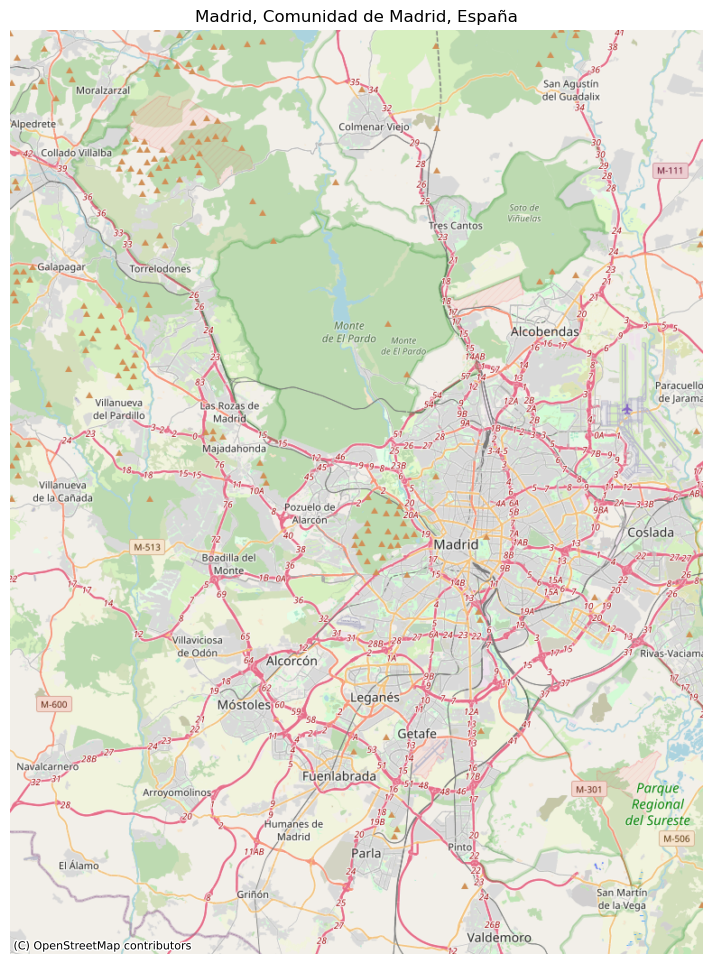

In [6]:
madrid = ctx.Place("Madrid", source=src)
madrid.plot()

 Narišemo zemljevid Slovenije.

<Axes: title={'center': 'Slovenija'}, xlabel='X', ylabel='Y'>

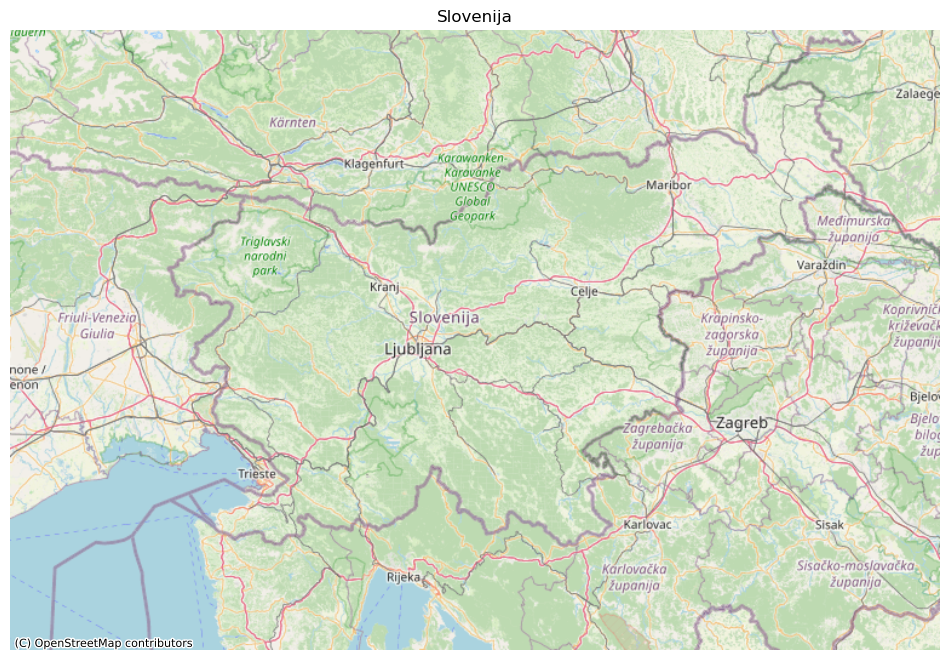

In [7]:
# Naredi zemljevid Slovenije
slovenia = ctx.Place("Slovenia", source=src)
slovenia.plot()

In [8]:
zoom = 6
loc = ctx.Place("slovenia", zoom=zoom, source=src)
loc

Place : Slovenija | n_tiles: 1 | zoom : 6 | im : (256, 256)

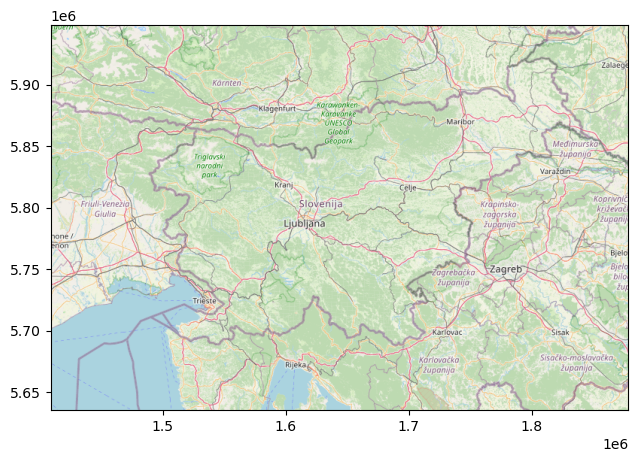

In [9]:
zoom = ctx.tile._calculate_zoom(loc.w, loc.s, loc.e, loc.n)
im2, bbox = ctx.bounds2img(loc.w, loc.s, loc.e, loc.n, zoom=zoom, ll=True, source=src)

ax = plt.gca()
ax.imshow(im2, extent=bbox, origin="upper")
plt.show()

In [10]:
zoom

8

## Ustvarjanje prostorskega podatkovnega okvirja - GeoDataFrame

Ustvarili bomo *običajni* `DataFrame` in iz njega naredili tako imenovani `GeoDataFrame`, to je GeoPandas razširitev osnovnega podatkovnega tipa. `DataFrame` ima lahko koordinate v obliki WKT [well-known text](https://en.wikipedia.org/wiki/Well-known_text) ali v dveh stolpcih.

Najprej ustvarimo `DataFrame` z geografsko dolžino in širino. pandas lahko pretvori različne tipe podatkov, mi bomo uporabili slovar (dictionary). Slovar, ki ga predstavlja razred `dict`, je podatkovna struktura, v kateri do elementov dostopamo prek unikatnih `ključev`. Slovar ni urejen: elementi niso zloženi ne po vrstnem redu dodajanja, ne po kaki relaciji urejenosti. 

In [11]:
# Kraji v obliki dictionay
eu_cap_fn = data_path + "capitals.json"

In [12]:
# Ustvarimo DataFrame
eu_capitals_df = pd.read_json(eu_cap_fn)
eu_capitals_df

,State,Capital,Lat,Lon,Alt
0,Austria,Vienna,48.2092,16.3728,170
1,Bosnia and Herzegovina,Sarajevo,43.8608,18.4214,577
2,Croatia,Zagreb,45.8150,15.9785,130
3,Italy,Roma / Rome,41.8955,12.4823,14
4,Kosovo,Prishtine / Pristina,42.6740,21.1788,652
5,Montenegro,Podgorica,42.4602,19.2595,61
6,North Macedonia,Skopje,42.0024,21.4361,243
7,Serbia,Beograd / Belgrade,44.8048,20.4781,116
8,Slovenia,Ljubljana,46.0514,14.5060,281


`GeoDataFrame` potrebuje objekte tipa `shapely`. Uporabili bomo funkcijo `points_from_xy()` za pretvorbo *Lon* and *Lat* v seznam (list) objektov tipa `shapely.Point` in jih v `GeoDataFrame` imenovali (atribut) `geometry`.

In [13]:
# Ustvarimo GeoDataFrame
eu_capitals_gdf = gpd.GeoDataFrame(
    eu_capitals_df, geometry=gpd.points_from_xy(eu_capitals_df.Lon, eu_capitals_df.Lat)
)

`eu_capitals_gdf` lahko pogledamo in tudi izrišemo.


In [14]:
print(eu_capitals_gdf)

                    State               Capital      Lat      Lon  Alt  \
0                 Austria                Vienna  48.2092  16.3728  170   
1  Bosnia and Herzegovina              Sarajevo  43.8608  18.4214  577   
2                 Croatia                Zagreb  45.8150  15.9785  130   
3                   Italy           Roma / Rome  41.8955  12.4823   14   
4                  Kosovo  Prishtine / Pristina  42.6740  21.1788  652   
5              Montenegro             Podgorica  42.4602  19.2595   61   
6         North Macedonia                Skopje  42.0024  21.4361  243   
7                  Serbia    Beograd / Belgrade  44.8048  20.4781  116   
8                Slovenia             Ljubljana  46.0514  14.5060  281   

                  geometry  
0  POINT (16.3728 48.2092)  
1  POINT (18.4214 43.8608)  
2   POINT (15.9785 45.815)  
3  POINT (12.4823 41.8955)  
4   POINT (21.1788 42.674)  
5  POINT (19.2595 42.4602)  
6  POINT (21.4361 42.0024)  
7  POINT (20.4781 44.8048) 

In [15]:
eu_capitals_gdf.head()

,State,Capital,Lat,Lon,Alt,geometry
0,Austria,Vienna,48.2092,16.3728,170,POINT (16.3728 48.2092)
1,Bosnia and Herzegovina,Sarajevo,43.8608,18.4214,577,POINT (18.4214 43.8608)
2,Croatia,Zagreb,45.8150,15.9785,130,POINT (15.9785 45.815)
3,Italy,Roma / Rome,41.8955,12.4823,14,POINT (12.4823 41.8955)
4,Kosovo,Prishtine / Pristina,42.6740,21.1788,652,POINT (21.1788 42.674)


<Axes: >

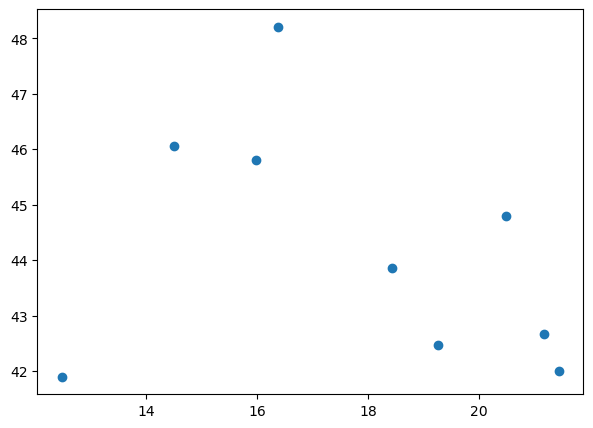

In [16]:
# Izris GeoDataFrame
eu_capitals_gdf.plot()

Seveda je taka karta popolnoma neuporabna, zato poiščimo ozadje in glavna mesta narišimo prek neke osnovne karte. Geodatasets že vključuje nekaj slojev baze Natural Earth.

[Natural Earth](http://www.naturalearthdata.com) je nabor odprtih podatkov, ki je na voljo v merilih 1 : 10 m, 1 : 50 m in 1 : 110 milijonov. Natural Earth vsebuje vektorske in rastrske podatke, ki jih lahko uporabimo za kartografijo. Podmnožica podatkov je priložena GeoPandasu, in sicer v knjižnici geodatasets, in je dostopna iz modula `geodatasets.datasets`. Uporabili jo bomo kot osnovni globalni zemljevid.

In [17]:
# Izpiši sloje iz geodatasets
geodatasets.data

{'geoda': {'airbnb': {'url': 'https://geodacenter.github.io/data-and-lab//data/airbnb.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.airbnb',
   'description': 'Airbnb rentals, socioeconomics, and crime in Chicago',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//airbnb/',
   'hash': 'a2ab1e3f938226d287dd76cde18c00e2d3a260640dd826da7131827d9e76c824',
   'filename': 'airbnb.zip'},
  'atlanta': {'url': 'https://geodacenter.github.io/data-and-lab//data/atlanta_hom.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.atlanta',
   'description': 'Atlanta, GA region homicide counts and rates',
   'geometry_type': 'Polygon',
   'nrows': 90,
   'ncols': 24,
   'details': 'https://geodacenter.github.io/data-and-lab//atlanta_old/',
   'hash': 'a33a76e12168fe84361e60c88a9df4856730487305846c559715c89b1a2b5e09',
   'filename': 'atlanta_hom.zip',
   'members': ['atlanta_hom/atl_hom.geojson']},
  'cars': {'url': 'https://geodacenter.github.io/data-and-lab//data/Abandoned_Vehicles_Map.csv',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.cars',
   'description': '2011 abandoned vehicles in Chicago (311 complaints).',
   'geometry_type': 'Point',
   'nrows': 137867,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//1-source-and-description/',
   'hash': '6a0b23bc7eda2dcf1af02d43ccf506b24ca8d8c6dc2fe86a2a1cc051b03aae9e',
   'filename': 'Abandoned_Vehicles_Map.csv'},
  'charleston1': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston1',
   'description': '2000 Census Tract Data for Charleston, SC MSA and counties',
   'geometry_type': 'Polygon',
   'nrows': 117,
   'ncols': 31,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston-1_old/',
   'hash': '4a4fa9c8dd4231ae0b2f12f24895b8336bcab0c28c48653a967cffe011f63a7c',
   'filename': 'CharlestonMSA.zip',
   'members': ['CharlestonMSA/sc_final_census2.gpkg']},
  'charleston2': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA2.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston2',
   'description': '1998 and 2001 Zip Code Business Patterns (Census Bureau) for Charleston, SC MSA',
   'geometry_type': 'Polygon',
   'nrows': 42,
   'ncols': 60,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston2/',
   'hash': '056d5d6e236b5bd95f5aee26c77bbe7d61bd07db5aaf72866c2f545205c1d8d7',
   'filename': 'CharlestonMSA2.zip',
   'members': ['CharlestonMSA2/CharlestonMSA2.gpkg']},
  'chicago_health': {'url': 'https://geodacenter.github.io/data-and-lab//data/comarea.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_health',
   'description': 'Chicago Health + Socio-Economics',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 87,
   'details': 'https://geodacenter.github.io/data-and-lab//comarea_vars/',
   'hash': '4e872adb552786eae2fcd745524696e5e4cd33cc9a6c032471c0e75328871401',
   'filename': 'comarea.zip'},
  'chicago_commpop': {'url': 'https://geodacenter.github.io/data-and-lab//data/chicago_commpop.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_commpop',
   'description': 'Chicago Community Area Population Percent Change for 2000 and 2010',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 9,
   'details': 'https://geodacenter.github.io/data-and-lab//commpop/',
   'hash': '1dbebb50c8ea47e2279ea819ef64ba793bdee2b88e4716bd6c6ec0e0d8e0e05b',
   'filename': 'c

In [18]:
# Preberemo sloj naturalearth.land
world_path = geodatasets.get_path("naturalearth.land")
world = gpd.read_file(world_path)

world.head()

,featurecla,scalerank,min_zoom,geometry
0,Land,1,1.0,"POLYGON ((-59.57209 -80.04018, -59.86585 -80.5..."
1,Land,1,1.0,"POLYGON ((-159.20818 -79.49706, -161.1276 -79...."
2,Land,1,0.0,"POLYGON ((-45.15476 -78.04707, -43.92083 -78.4..."
3,Land,1,1.0,"POLYGON ((-121.21151 -73.50099, -119.91885 -73..."
4,Land,1,1.0,"POLYGON ((-125.55957 -73.48135, -124.03188 -73..."


In [19]:
# Preberemo sloj eurostat.nuts_lb_2024_3035
nuts_path = geodatasets.get_path("eurostat.nuts_rg_10m_2024_3035")
nuts = gpd.read_file(nuts_path)
nuts.head()

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,geometry
0,AT127,3,AT,Wiener Umland/Südteil,Wiener Umland/Südteil,NaN,2.0,NaN,"POLYGON ((4761472.615 2792467.94, 4766617.881 ..."
1,AT130,3,AT,Wien,Wien,NaN,1.0,NaN,"POLYGON ((4780587.347 2803485.343, 4782059.324..."
2,AT211,3,AT,Klagenfurt-Villach,Klagenfurt-Villach,1.0,2.0,NaN,"POLYGON ((4589828.59 2612229.34, 4593407.991 2..."
3,AT212,3,AT,Oberkärnten,Oberkärnten,1.0,3.0,NaN,"POLYGON ((4530306.2 2617285.815, 4527096.513 2..."
4,AT213,3,AT,Unterkärnten,Unterkärnten,1.0,3.0,NaN,"POLYGON ((4621593.145 2655568.151, 4639616.664..."


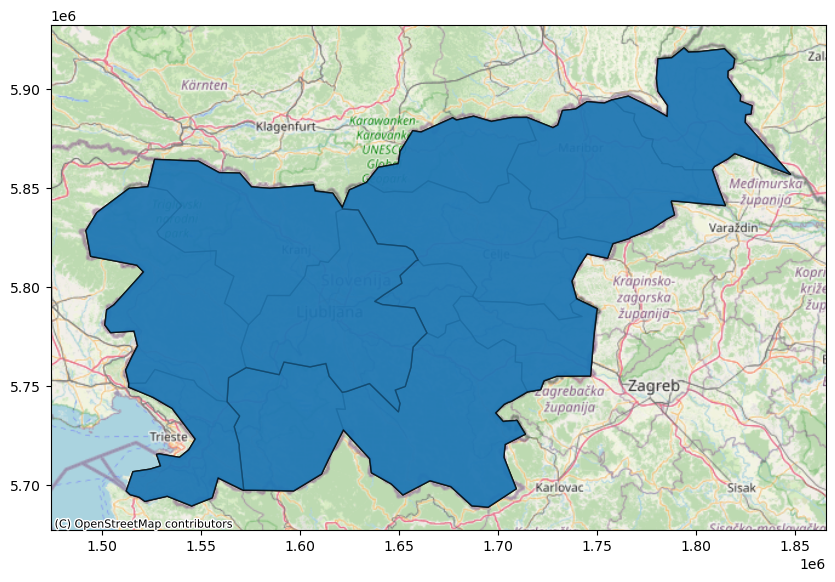

In [20]:
# Izberemo samo Slovenijo iz nuts, dodamo ozadje
nuts_slo = nuts[nuts["CNTR_CODE"] == "SI"].to_crs(epsg=3857)  # important!
ax = nuts_slo.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

In [21]:
# Preberi podatke o svetu
url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)
world.head()

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,NaN,NaN,Unrecognized,NaN,NaN,NaN,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."


In [22]:
# Stolpci v GeoDataFrame
world.columns

Index(['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3',
       'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN',
       ...
       'FCLASS_TR', 'FCLASS_ID', 'FCLASS_PL', 'FCLASS_GR', 'FCLASS_IT',
       'FCLASS_NL', 'FCLASS_SE', 'FCLASS_BD', 'FCLASS_UA', 'geometry'],
      dtype='str', length=169)

Sloj lahko tudi prikažemo.

<Axes: >

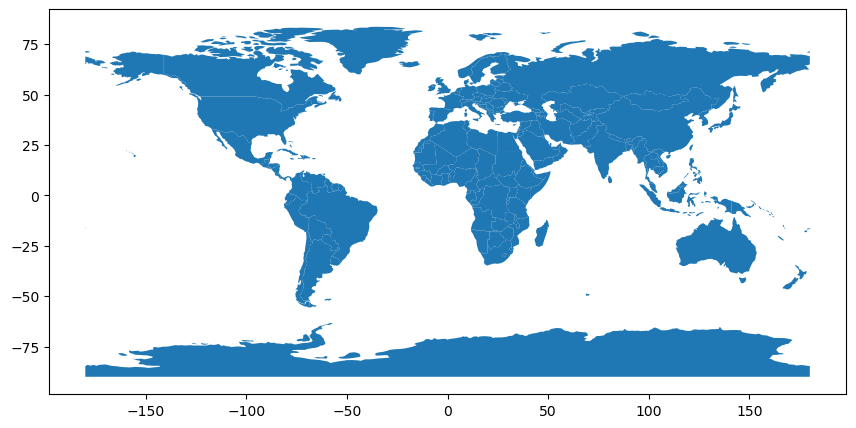

In [23]:
world.plot()

## Obdelava podatkov

GeoPandas deluje zelo podobno kot pandas. Z njim lahko opravljamo operacije indeksiranja, podatke režemo po indeksih (stolpci in vrstice), lahko dodajamo nove atribute, delamo lahko tudi prostorske operacije. Recimo, da se omejimo na Afriko, imena celin so v stolpcu `continent`.

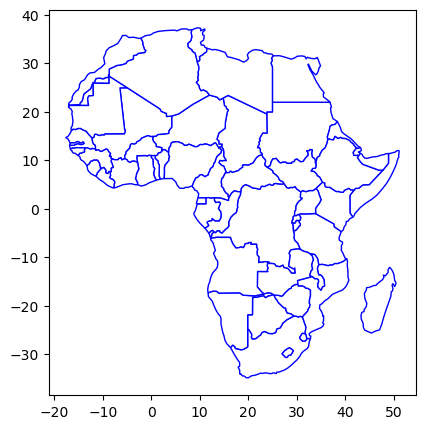

In [24]:
world[world.CONTINENT == "Africa"].plot(color="white", edgecolor="blue")
plt.show()

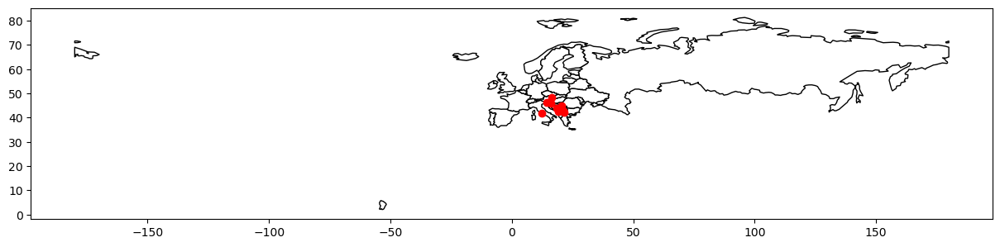

In [25]:
# Prikažimo izbrana glavna mesta in se omejimo na Evropo
ax = world[world.CONTINENT == "Europe"].plot(color="white", edgecolor="black")
eu_capitals_gdf.plot(ax=ax, color="red")
plt.show()

Ker je Rusija vključena v Evropo, je zemljevid neuporaben. Naredimo hitro poizvedbo in se omejimo na Evropo brez Rusije. Ker pri kartiranju delata težave tudi Islandija in Francoska Gvajana, bomo karto še obrezali.

In [26]:
# Izločimo Rusijo
europe = world[world.CONTINENT == "Europe"].copy()
europe = europe[europe["NAME"] != "Russia"]
europe.head()

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
21,Admin-0 country,1,3,Norway,NOR,0,2,Sovereign country,NaN,Norway,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((15.14282 79.67431, 15.52255 80..."
43,Admin-0 country,1,2,France,FR1,1,2,Country,1,France,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((-51.6578 4.15623, -52.24934 3...."
110,Admin-0 country,1,3,Sweden,SWE,0,2,Sovereign country,1,Sweden,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((11.02737 58.85615, 11.46827 59.43239..."
111,Admin-0 country,1,4,Belarus,BLR,0,2,Sovereign country,1,Belarus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((28.17671 56.16913, 29.22951 55.91834..."
112,Admin-0 country,1,3,Ukraine,UKR,0,2,Sovereign country,1,Ukraine,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((31.78599 52.10168, 32.15944 52.06125..."


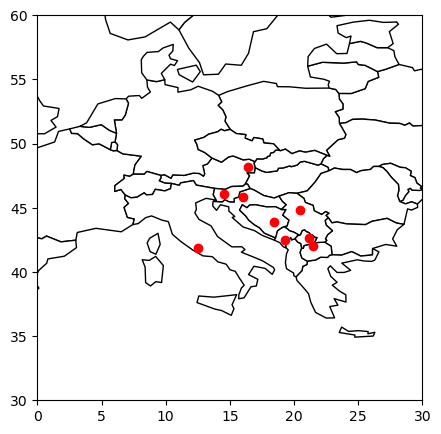

In [27]:
# Prikažimo glavna mesta in se omejimo na Evropo
ax = europe.plot(color="white", edgecolor="black")
eu_capitals_gdf.plot(
    ax=ax,
    color="red",
)
plt.xlim(0, 30)
plt.ylim(30, 60)
plt.show()

## Dodajanje ozadja

V sodobnih GIS orodjih lahko kot ozadje dodamo tudi podatke s spleta. Enako lahko storimo v Pythonu, uporabiti moramo knjižnico [contextily](https://github.com/darribas/contextily), ki lahko podatke pridobi v obliki kosov (tiles) iz več virov (OpenStreetMap, Stamen, ...).

Spletni kartografski servisi podatke praviloma podajajo v projekciji [Web Mercator](https://en.wikipedia.org/wiki/Web_Mercator), to je [EPSG 3857](https://epsg.io/3857). Zato moramo opraviti ustrezno preprojekcijo. GeoPandas dobro dela s projekcijami, dokumentacija je tule [Managing Projections](
https://geopandas.org/projections.html).

In [28]:
# Podatkom dodamo projekcijo
eu_capitals_gdf.crs = "epsg:4326"
eu_capitals_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [29]:
# Prepprojeciramo v Web Mercator
eu_capitals_gdf_wm = eu_capitals_gdf.to_crs("epsg:3857")
eu_capitals_gdf_wm.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

contextily uporablja različne podatkovne vire, lahko dodamo tudi svoje, če je poznamo ULR. Razpoložljive vire prikažemo z ukazom `ctx.providers`. Podrobno o knjižnici, kartiranju, ponudnikih je na voljo v [contextily: context geo tiles in Python](https://contextily.readthedocs.io/en/latest/index.html).

In [30]:
ctx.providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'name': 'OpenStreetMap.CAT'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contribut

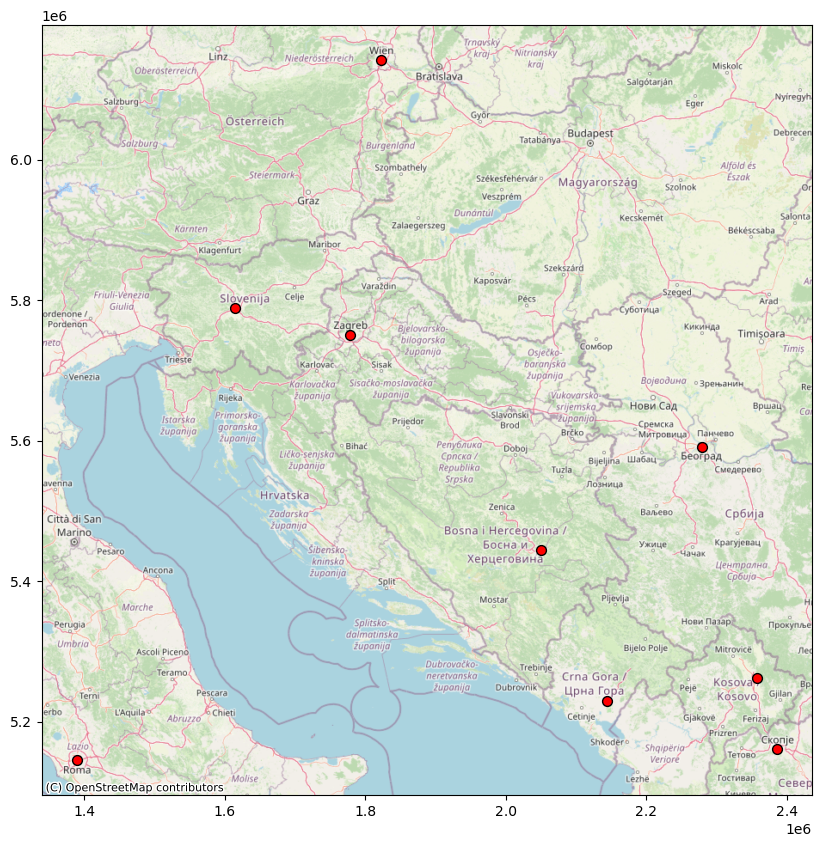

In [31]:
# Prikažemo na ozadju, ker gre za prenos prek spleta, moramo malo počakati
ax = eu_capitals_gdf_wm.plot(
    figsize=(15, 10), edgecolor="k", color="red", markersize=50
)
ctx.add_basemap(ax, source=src)

Stopnjo podrobnosti lahko določamo s parametrom `zoom` (če pretiravamo, traja prenos zelo dolgo časa).

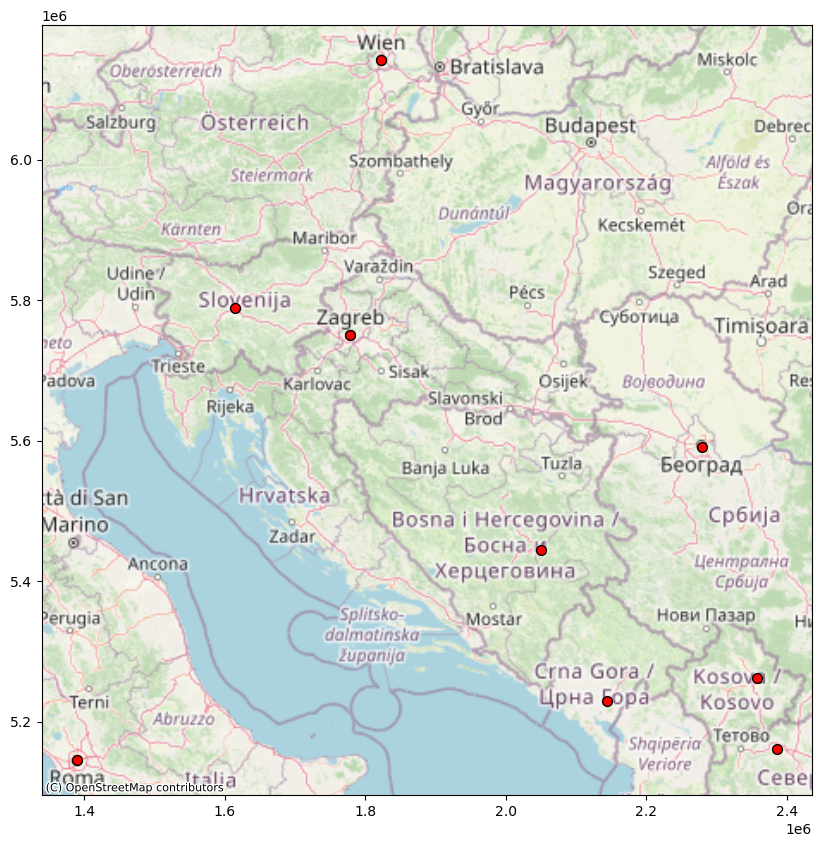

In [32]:
ax = eu_capitals_gdf_wm.plot(
    figsize=(15, 10), edgecolor="k", color="red", markersize=50
)
ctx.add_basemap(ax, zoom=6, source=src)

Privzeto contextily uporablja slog `Stamen Terrain`. Lahko pa uporabimo tudi katerega drugega. Razpoložljivi so v `ctx.providers`.

In [33]:
# Primer ponudnika
ctx.providers.Esri.NatGeoWorldMap

{'url': 'https://server.arcgisonline.com/ArcGIS/rest/services/{variant}/MapServer/tile/{z}/{y}/{x}',
 'variant': 'NatGeo_World_Map',
 'html_attribution': 'Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
 'attribution': 'Tiles (C) Esri -- National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
 'max_zoom': 16,
 'name': 'Esri.NatGeoWorldMap'}

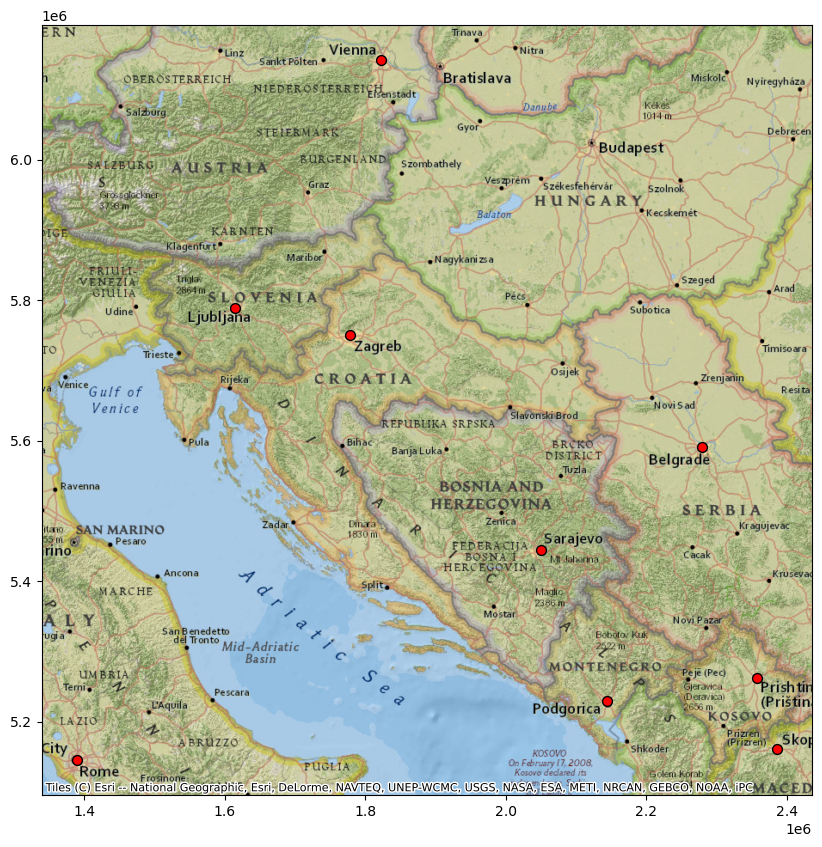

In [34]:
ax = eu_capitals_gdf_wm.plot(
    figsize=(15, 10), edgecolor="k", color="red", markersize=50
)
ctx.add_basemap(ax, source=ctx.providers.Esri.NatGeoWorldMap)

## Branje podatkov

GeoPandas bere podatke skoraj katerega koli vektorskega zapisa, vključno z ESRIjevim ShapeFile, GeoJSON in podobno. Pri tem uporabimo ukaz

```python
geopandas.read_file()
```

Ukaz vrne objekt tipa GeoDataFrame. GeoPandas v ozadju uporablja knjižnico  [Fiona](http://fiona.readthedocs.io/en/latest/manual.html), ki temelji na odprtokodnem projektu za delo s prostorskimi podatki [GDAL/OGR](http://www.gdal.org).

Vsak argument, ki je v ukazu `geopandas.read_file` za imenom datoteke, se posreduje naravnost funkciji `fiona.open`, ta pa poskrbi za samo branje. `geopandas.read_file` je sicer precej zmogljiv in večino nalog opravi brez težav, če pa se kaj zatakne, pomaga pomoč Fione.

```python
import fiona
help(fiona.open)
```

Med drugim lahko eksplicitno povemo za kakšen tip datoteke gre, in sicer ključno besedo `driver` navedemo gonilnik za branje (shapefile, GeoJSON), ali pa preberemo samo en sloj v večslojni datoteki s ključno besedo `layer`.

Fiona in GeoPandas lahko, če je le mogoče, podatke bereta tudi iz spleta, recimo takole.

```python
url = "http://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_land.geojson"
df = geopandas.read_file(url)
```

Lahko preberemo tudi podatke v datoteki ZIP. Pri tem lahko podatke beremo celo iz podmap in datotek v njih. Kar je milo rečeno imenitno.

```python
zipfile = "zip:///Users/name/Downloads/cb_2017_us_state_500k.zip"
states = geopandas.read_file(zipfile)

# Podmapa 
zipfile = "zip:///Users/name/Downloads/gadm36_AFG_shp.zip!sample"
# Datoteka v podmapi
zipfile = "zip:///Users/name/Downloads/gadm36_AFG_shp.zip!data/gadm36_AFG_1.shp"
```

GeoPandas lahko podatke dobi iz PostGIS podatkovne zbirke z ukazom `geopandas.read_postgis`.

### Branje podatkov RPE

Osnova [Registra prostorskih enot](https://www.e-prostor.gov.si/zbirke-prostorskih-podatkov/nepremicnine/register-prostorskih-enot/) je integrirana podatkovna baza z lokacijskimi in opisnimi podatki. V registru so evidentirane tudi vse hišne številke in se povezuje s katastrom stavb. Vsebina Registra prostorskih enot:

- osnovne prostorske enote: hišna številka, prostorski okoliš, statistični okoliš, naselje, občina, upravna enota, območje vodenja RPE, katastrska občina, država;
- dodatne prostorske enote: ulica, četrtna skupnost, vaška skupnost, krajevna skupnost, volišče za lokalne volitve, volišče za državnozborske volitve, volilna enota za lokalne volitve, volilni okraj za državnozborske volitve, volilna enota za državnozborske volitve, šolski okoliš.

Preberimo podatke o državni meji in občinah.

In [35]:
# Ime datoteke - državna meja
meja_fn = "zip://" + data_path + "DRZAVNA_MEJA.zip"
# Ime datoteke - RPE občine
obcine_fn = "zip://" + data_path + "RPE_PE_D96.zip/OB/OB.shp"

In [36]:
# Podatki o meji
slo_meja_gdf = gpd.read_file(meja_fn)
slo_meja_gdf.head()

,Id,Drzava,OCENA_NAT,geometry
0,241,SLO-HRV,do 4 cm,"LINESTRING Z (384658.9 42356.03 0, 379119.32 4..."
1,240,SLO-HRV,do 1 m,"LINESTRING Z (389423.1 38583.31 0, 384658.9 42..."
2,239,SLO-HRV,do 1 m,"LINESTRING Z (394542.83 35777.15 0, 394536.29 ..."
3,238,SLO-HRV,do 1 m,"LINESTRING Z (394537.99 35766.1 0, 394542.83 3..."
4,237,SLO-HRV,do 1 m,"LINESTRING Z (394753.77 35609.86 0, 394753.69 ..."


In jih prikažemo.

<Axes: >

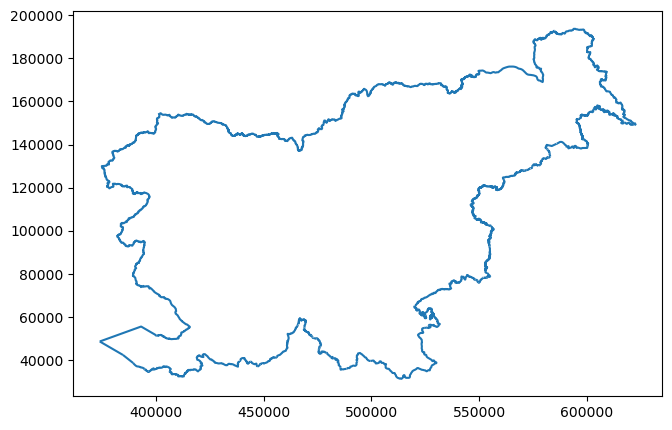

In [37]:
slo_meja_gdf.plot()

In [38]:
# Podatki o občinah
slo_ob_gdf = gpd.read_file(obcine_fn, encoding="cp1250")
slo_ob_gdf.head()

,ENOTA,OB_MID,OB_ID,OB_UIME,OB_TIP,POV_KM2,D_OD,DV_OD,STATUS,CEN_E,CEN_N,geometry
0,OB,11026923,40,Izola,N,28.50,2015-02-25,2015-02-25,V,395487.0,45087.0,"POLYGON ((394273.002 44593.853, 394286.002 446..."
1,OB,11027776,50,Koper,D,303.46,2015-02-25,2015-02-25,V,400787.0,45967.0,"POLYGON ((399594.693 45758.407, 399636.217 457..."
2,OB,11027997,90,Piran,N,43.50,2015-02-25,2015-02-25,V,388317.0,44187.0,"POLYGON ((387969.019 44395.363, 387992.8 44391..."
3,OB,24063526,213,Ankaran,N,8.04,2015-02-25,2015-02-25,V,401507.0,49597.0,"POLYGON ((399117.249 51162.701, 399161.274 511..."
4,OB,11026516,1,Ajdovščina,N,245.46,1995-01-01,1995-01-01,V,414738.0,83647.0,"POLYGON ((417272.799 90034.925, 417286.22 9001..."


<Axes: >

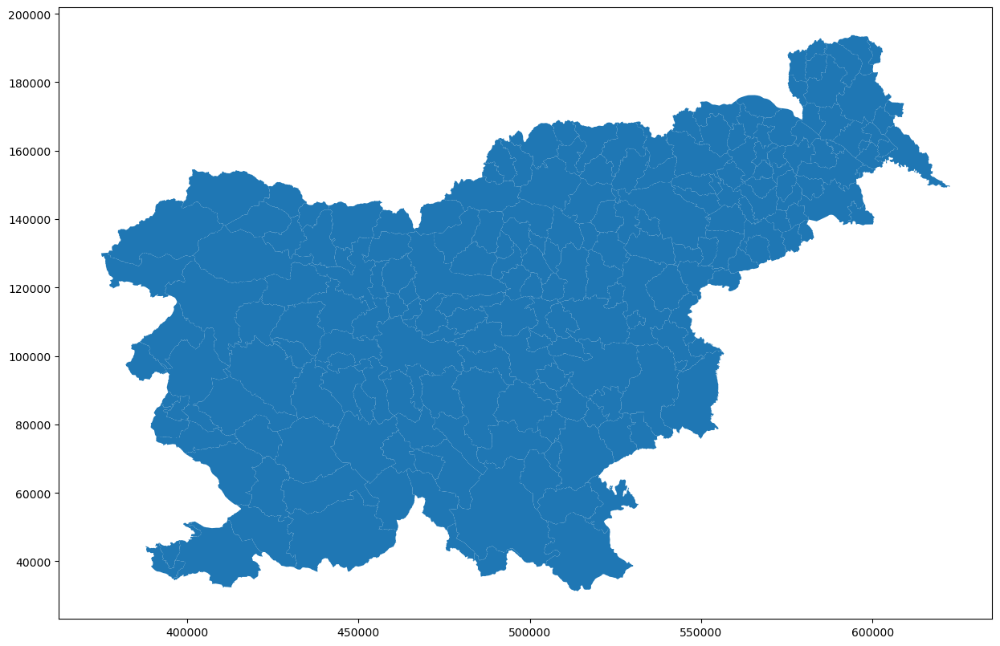

In [39]:
# Prikaz
slo_ob_gdf.plot(figsize=(15, 10))

Poglejmo podatke, ki so v datoteki in prikažimo površino v $km^2$, kar je atribut `POV_KM2`.

In [40]:
# Stolpci - atributi
slo_ob_gdf.columns

Index(['ENOTA', 'OB_MID', 'OB_ID', 'OB_UIME', 'OB_TIP', 'POV_KM2', 'D_OD',
       'DV_OD', 'STATUS', 'CEN_E', 'CEN_N', 'geometry'],
      dtype='str')

<Axes: >

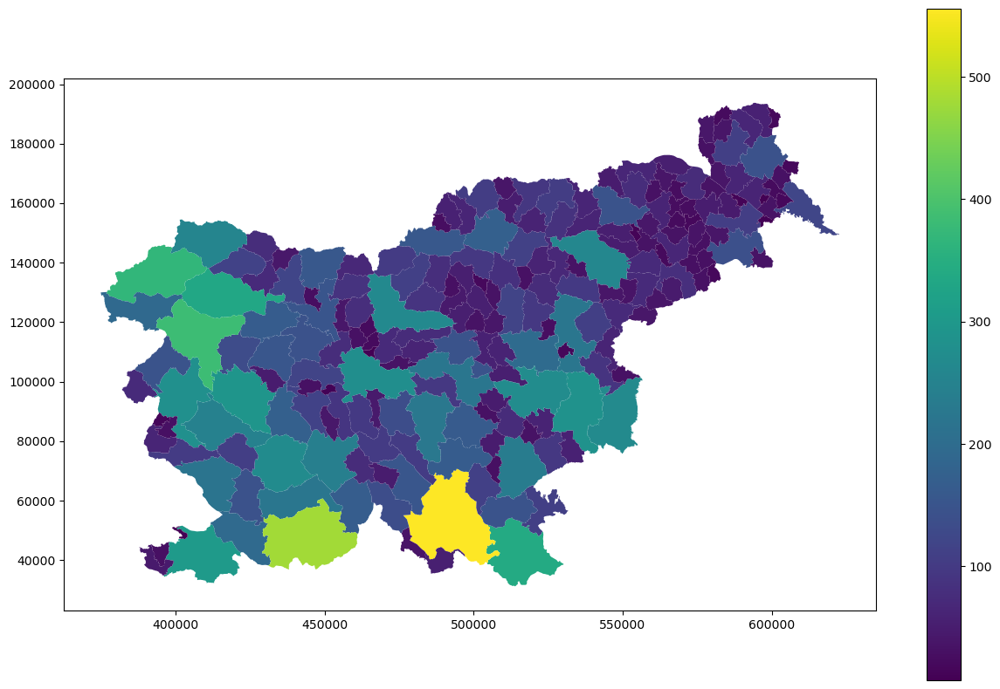

In [41]:
slo_ob_gdf.plot(figsize=(15, 10), column="POV_KM2", legend=True)

### Pisanje podatkov

GeoDataFrame lahko analiziramo z vsemi pandas orodji. Poiščimo recimo občine, ki so večje od $200 km^2<$, jih prikažimo in nato shranimo v novo datoteko.

In [42]:
# pandas poizvedba
slo_ob_gdf_velike = slo_ob_gdf[slo_ob_gdf["POV_KM2"] > 200]
slo_ob_gdf_velike.head()

,ENOTA,OB_MID,OB_ID,OB_UIME,OB_TIP,POV_KM2,D_OD,DV_OD,STATUS,CEN_E,CEN_N,geometry
1,OB,11027776,50,Koper,D,303.46,2015-02-25,2015-02-25,V,400787.0,45967.0,"POLYGON ((399594.693 45758.407, 399636.217 457..."
4,OB,11026516,1,Ajdovščina,N,245.46,1995-01-01,1995-01-01,V,414738.0,83647.0,"POLYGON ((417272.799 90034.925, 417286.22 9001..."
7,OB,11026559,4,Bohinj,N,333.84,1995-01-01,1995-01-01,V,419259.0,126588.0,"POLYGON ((408416.333 122753.324, 408396.453 12..."
8,OB,11026575,6,Bovec,N,367.47,1995-01-01,1995-01-01,V,388448.0,134028.0,"POLYGON ((396461.451 145859.172, 396481.232 14..."
11,OB,11026605,9,Brežice,N,268.00,1995-01-01,1995-01-01,V,545949.0,85164.0,"POLYGON ((554302.947 95144.915, 554308.706 951..."


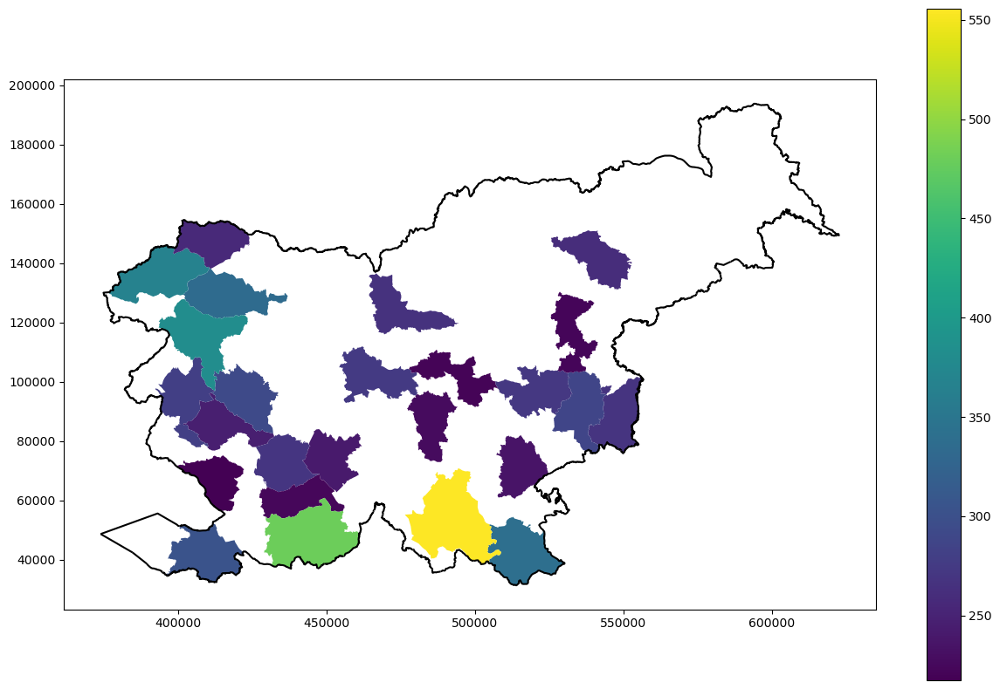

In [43]:
# Prikažemo velike občine, dodamo mejo za orientacijo
ax = slo_ob_gdf_velike.plot(figsize=(15, 10), column="POV_KM2", legend=True)
slo_meja_gdf.plot(ax=ax, edgecolor="black")
plt.show()

GeoDataFrame lahko zapišemo v različne formate z ukazom `geopandas.GeoDataFrame.to_file`. Seznam podprtih zapisov dobimo z

```python
import fiona
fiona.supported_drivers`
```

Pišemo lahko v

- Shapefile   
`slo_ob_gdf.to_file("obcine_velike.shp")`
- GeoJSON  
`slo_ob_gdf.to_file("countries.geojson", driver='GeoJSON')`
- GeoPackage  
`slo_ob_gdf.to_file("package.gpkg", layer='countries', driver="GPKG")`   
`cities_gdf.to_file("package.gpkg", layer='cities', driver="GPKG")`

In [44]:
# Zapišemo v GeoPackage
slo_ob_gdf.to_file("slo_obcine.gpkg", layer="obcine", driver="GPKG")

In [45]:
# Zapišemo velike občine v datoteko Shapefile
slo_ob_gdf.to_file("obcine_velike.shp")

c:\Users\krost\miniforge3\envs\geoinfo\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Field D_OD created as String field, though DateTime requested.
  ogr_write(
c:\Users\krost\miniforge3\envs\geoinfo\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Field DV_OD created as String field, though DateTime requested.
  ogr_write(


## Skupni prikaz

Prikažimo na koncu velike občine in njihovo površino na ozadju `Stamen Terrain`. Ne smemo pozabiti podatkov preprojicirati.

In [46]:
# CRS
slo_ob_gdf_velike.crs

<Projected CRS: EPSG:3794>
Name: Slovenia 1996 / Slovene National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Slovenia - onshore and offshore.
- bounds: (13.38, 45.42, 16.61, 46.88)
Coordinate Operation:
- name: Slovene National Grid
- method: Transverse Mercator
Datum: Slovenia Geodetic Datum 1996
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [47]:
# Preprojekcija
slo_ob_gdf_velike_we = slo_ob_gdf_velike.to_crs("epsg:3857")
slo_meja_gdf_we = slo_meja_gdf.to_crs("epsg:3857")

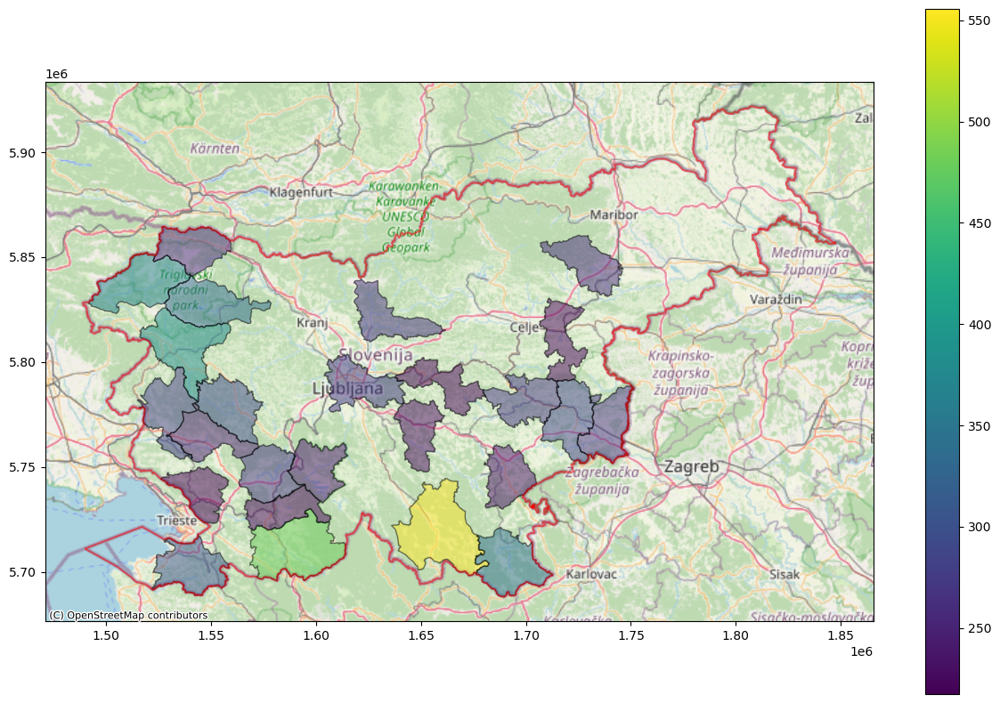

In [48]:
# Prikaz
ax = slo_ob_gdf_velike_we.plot(
    figsize=(15, 10), alpha=0.5, edgecolor="k", column="POV_KM2", legend=True
)
slo_meja_gdf_we.plot(ax=ax, edgecolor="red", alpha=0.5)
ctx.add_basemap(ax, source=src)

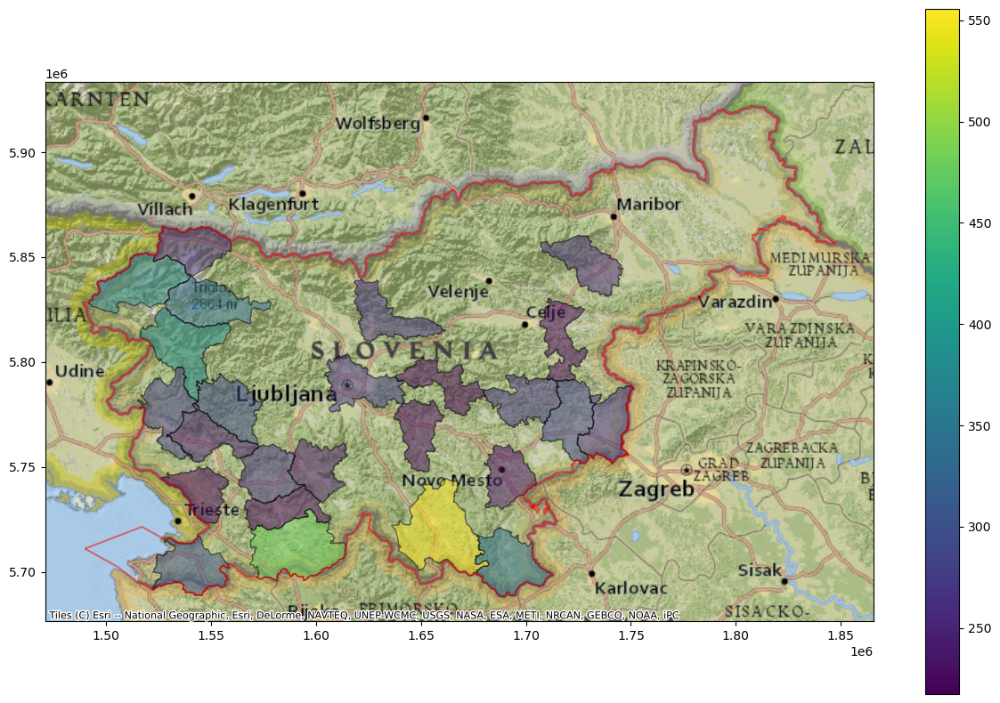

In [49]:
# Prikaz
ax = slo_ob_gdf_velike_we.plot(
    figsize=(15, 10), alpha=0.5, edgecolor="k", column="POV_KM2", legend=True
)
slo_meja_gdf_we.plot(ax=ax, edgecolor="red", alpha=0.5)
ctx.add_basemap(ax, source=ctx.providers.Esri.NatGeoWorldMap)

## Naloge

GeoPandas je zmogljivo orodje za obdelavo prostorskih podatkov. Razišči podatke RPE in naredi nekaj osnovnih analiz ter prikazov. Grafikone lahko delamo enega nad drugim ali enega poleg drugega. Preveri tudi različne ponudnike spletnih kartografskih servisov.

Pripravi poročilo v obliki Jupyter beležnice. Ne pozabi na komentarje in ugotovitve.